## 1. References



#### Dataset was downloaded at Vancouver Police Department website
- https://geodash.vpd.ca/opendata/

#### Make folium HeatMap, MarkerCluster
- https://medium.com/datasciencearth/map-visualization-with-folium-d1403771717

## 2. Library import and data loading

In [1]:
# Import pandas, numpy, seaborn, matplotlib.pyplot libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Load clean dataset from proposal term project
df = pd.read_csv("./Dataset/crimedata_cleaned_dummies.csv")
df.head(5)

,type,year,month,day,hour,minute,x,y,longtitude,latitude,...,neighb_Riley_Park,neighb_Shaughnessy,neighb_South_Cambie,neighb_Stanley_Park,neighb_Strathcona,neighb_Sunset,neighb_Victoria_Fraserview,neighb_West_End,neighb_West_Point_Grey,type_lable
0,Break and Enter Commercial,2019,3,7,2,6,490612.9648,5.457110e+06,-123.129029,49.266678,...,0,0,0,0,0,0,0,0,0,0
1,Break and Enter Commercial,2019,8,27,4,12,491007.7798,5.459174e+06,-123.123649,49.285255,...,0,0,0,0,0,0,0,1,0,0
2,Break and Enter Commercial,2021,4,26,4,44,491007.7798,5.459174e+06,-123.123649,49.285255,...,0,0,0,0,0,0,0,1,0,0
3,Break and Enter Commercial,2014,8,8,5,13,491015.9434,5.459166e+06,-123.123536,49.285181,...,0,0,0,0,0,0,0,1,0,0
4,Break and Enter Commercial,2020,7,28,19,12,491015.9434,5.459166e+06,-123.123536,49.285181,...,0,0,0,0,0,0,0,1,0,0


## 3. Additional data wrangling

Check the label for crime type before we drop column type.

In [3]:
# Show type and type_lable after using LabelEncoder
df_label = df[['type', 'type_lable']]
df_label.drop_duplicates(subset=['type','type_lable'],inplace=True)
df_label.reset_index(drop = True , inplace=True)
df_label

C:\Users\thien\AppData\Local\Temp\ipykernel_3852\316230322.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_label.drop_duplicates(subset=['type','type_lable'],inplace=True)


,type,type_lable
0,Break and Enter Commercial,0
1,Break and Enter Residential/Other,1
2,Homicide,2
3,Mischief,3
4,Offence Against a Person,4
5,Other Theft,5
6,Theft from Vehicle,6
7,Theft of Bicycle,7
8,Theft of Vehicle,8
9,Vehicel coll/Pedes Struck,9


## 4. Additional visualization

Create a heatmap that shows the correlation between features

C:\Users\thien\AppData\Local\Temp\ipykernel_3852\85309282.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


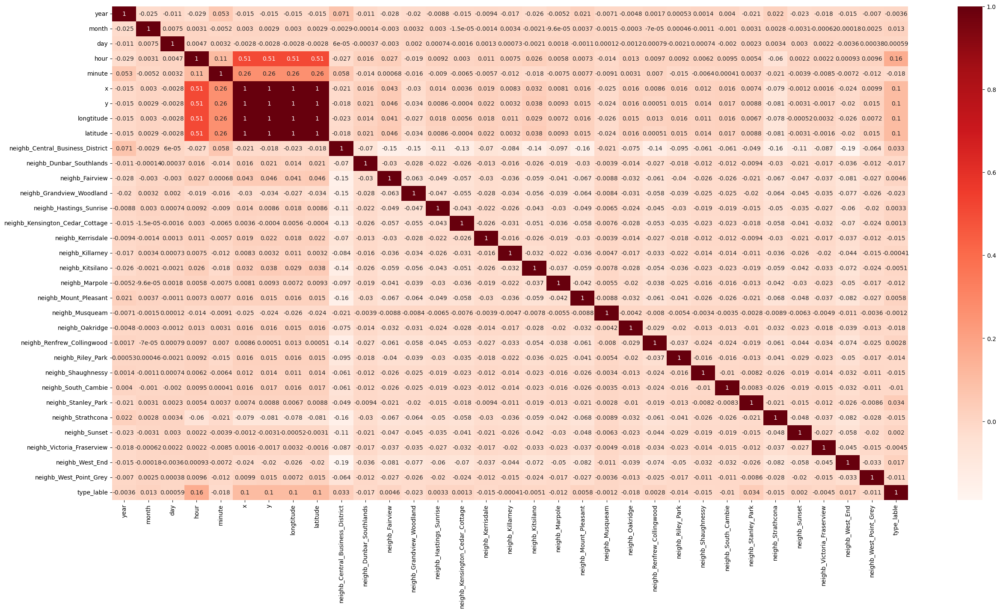

In [4]:
# Correlation heatmap
plt.figure(figsize=(30,15))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

The heatmap shows a minimal correlation between features and type_label. Only longitude, latitude, and hour values ​​are about 0.1 to 0.16.

Jupyter Notebook needs to have the folium library installed to show crime graphs on the map
- $ pip install folium

or
- $ conda install -c conda-forge folium

In [5]:
# Install folium for mapping crime
! pip install folium
import folium
from folium.plugins import HeatMap, MarkerCluster

In [6]:
# Function to determine crime location by year
def crime_locations(year):
    latitude = df.query("year == @year")["latitude"]
    lontitude = df.query("year == @year")["longtitude"]
    return list(zip(latitude, lontitude))

In [7]:
# Show crime heatmap, zoom in to have more details
crime_2021 = crime_locations(2021)
crime_heatmap = folium.Map(location=[49.2422, -123.1133], attr="Stamen Terrain", zoom_start=12)

HeatMap(crime_2021, min_opacity=0.1).add_to(crime_heatmap)
crime_heatmap


The heatmap chart provides the concentration of crime types by area. Zooming in will check the routes or locations where many crime problems occur.

In [8]:
#  Function to determine crime type location by year
def crime_type_location(year, _type):
    crimes_year = df.query("year == @year")
    latitude = crimes_year[crimes_year["type"]==_type]["latitude"]
    lonngtitude = crimes_year[crimes_year["type"]==_type]["longtitude"]
    return list(zip(latitude, lonngtitude))

Theft from Vehicle accounts for the most significant proportion of crimes. Check the number and locations where this type of crime occurs in 2021.

In [9]:
print("Theft from Vehicle in 2021")
theft_from_vehicle = crime_type_location(2021, "Theft from Vehicle")
theft_location = folium.Map(location= [49.2422, -123.1133], tiles = "OpenStreetMap", zoom_start = 12)
popups = ["Theft from Vehicle" for _ in range(len(theft_from_vehicle))]
MarkerCluster(theft_from_vehicle, popups=popups).add_to(theft_location)
theft_location

Theft from Vehicle in 2021


In 2021, the Theft from Vehicle crime category had an apparent concentration in several locations. This is essential data to predict the likelihood of crime problems in 2022.

## 5. Predict the Crime

### 5.1 LogisticRegression, Gaussian Naive Bayes and DecisionTreeClassifier

We use LogisticRegression, Gaussian Naive Bayes and DecisionTreeClassifier models to build the crime prediction model.

In [10]:
# Remove unneeded column "type" after we have type_label
df.drop('type', axis=1, inplace=True)

In [11]:
# Check df shape
df.shape

(830081, 33)

In [12]:
df.head()

,year,month,day,hour,minute,x,y,longtitude,latitude,neighb_Central_Business_District,...,neighb_Riley_Park,neighb_Shaughnessy,neighb_South_Cambie,neighb_Stanley_Park,neighb_Strathcona,neighb_Sunset,neighb_Victoria_Fraserview,neighb_West_End,neighb_West_Point_Grey,type_lable
0,2019,3,7,2,6,490612.9648,5.457110e+06,-123.129029,49.266678,0,...,0,0,0,0,0,0,0,0,0,0
1,2019,8,27,4,12,491007.7798,5.459174e+06,-123.123649,49.285255,0,...,0,0,0,0,0,0,0,1,0,0
2,2021,4,26,4,44,491007.7798,5.459174e+06,-123.123649,49.285255,0,...,0,0,0,0,0,0,0,1,0,0
3,2014,8,8,5,13,491015.9434,5.459166e+06,-123.123536,49.285181,0,...,0,0,0,0,0,0,0,1,0,0
4,2020,7,28,19,12,491015.9434,5.459166e+06,-123.123536,49.285181,0,...,0,0,0,0,0,0,0,1,0,0


We will use 95% for training and testing the model and 5% as an out-of-sample for checking our model's working.
We need to sort the dataset in chronological order, then take the nearest 5% of the data in 2022 to create an out-of-sample dataset.

In [13]:
df = df.sort_values(by=['year', 'month', 'day'], ascending=[True, True, True])
df.reset_index(drop=True, inplace=True)
df.head()

,year,month,day,hour,minute,x,y,longtitude,latitude,neighb_Central_Business_District,...,neighb_Riley_Park,neighb_Shaughnessy,neighb_South_Cambie,neighb_Stanley_Park,neighb_Strathcona,neighb_Sunset,neighb_Victoria_Fraserview,neighb_West_End,neighb_West_Point_Grey,type_lable
0,2003,1,1,23,19,494077.8426,5.458386e+06,-123.081422,49.278202,0,...,0,0,0,0,1,0,0,0,0,0
1,2003,1,1,7,13,489132.0318,5.451860e+06,-123.149243,49.219430,0,...,0,0,0,0,0,0,0,0,0,0
2,2003,1,1,12,49,497676.1944,5.456231e+06,-123.031937,49.258843,0,...,0,0,0,0,0,0,0,0,0,0
3,2003,1,1,11,0,493447.8835,5.455621e+06,-123.090038,49.253321,0,...,1,0,0,0,0,0,0,0,0,0
4,2003,1,1,7,13,493431.7950,5.454538e+06,-123.090241,49.243583,0,...,0,0,0,0,0,0,0,0,0,0


Divide the data set into two parts. The 5% part will have about 41,000 rows.

In [14]:
# Dataset for training and testing
df2 = df.loc[:789081,:]
# Out-of-sample dataset
Out_of_sample_df = df.loc[789081:,:]
print(df2.shape)
print(Out_of_sample_df.shape)

(789082, 33)
(41000, 33)


Models used include LogisticRegression, GaussianNB and DecisionTreeClassifier

In [15]:
# Drop longitude and latitude columns which are only used for making map charts.
y = df2['type_lable']
X = df2.drop(['type_lable','latitude','longtitude'], axis=1)

In [16]:
# Use 70% for training and 30% for testing
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [17]:
# Import libraries
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import accuracy_score, log_loss

Using Pipeline to combine Robust Scaler and classifier models.

In [18]:
# Pipeline for RobustScaler and classifier models
scores = []
names = ["logistic regression", "naive bayes", "decision tree"]
classifiers = [LogisticRegression(), GaussianNB(), DecisionTreeClassifier(max_depth=3)]

for clf in classifiers:
    pipe = Pipeline([("scaler",RobustScaler()), ("classifier", clf)])
    pipe.fit(x_train, y_train)
    score = pipe.score(x_test, y_test)
    scores.append(score)
    
    print(clf)
    print("model score: %.3f" %(score))
    print()

C:\Users\thien\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()
model score: 0.403

GaussianNB()
model score: 0.283

DecisionTreeClassifier(max_depth=3)
model score: 0.428



Using classifier models gives low accuracy, about 43%. These models are unsuitable for generating prediction models with the given dataset.

### 5.2 Neural Network

We build the structure of the ANN to make the crime prediction. 
- 32 neurons in the input layer
- 4 combination of hidden layers (5,5), (5,0), (10,5), (10,0).

### Pre-processing

In [19]:
# Import MLPClassifier, Pipeline, RobustScaler
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [20]:
# Create lists to store our models and results
models =[]
score =[]
hidden_layer =[]

# List of hidden layers
layer1 = [5,10]
layer2 = [0,5]

Create two hidden layers, then make a combination of these hidden layers to create models.
Use the created models for testing and predicting the dataset.

In [21]:
# Make a nested loop to create a comnination of hidden layers
for a in layer1:
    for b in layer2:
        if(a>=b and b!=0):
            second_layer = MLPClassifier(learning_rate = 'adaptive', max_iter=1000, hidden_layer_sizes=(a,b))
            models.append(second_layer)
            hidden_layer.append("(" + str(a) + "," + str(b) + ")")
    first_layer = MLPClassifier(learning_rate = 'adaptive', max_iter=1000, hidden_layer_sizes=(a,))
    models.append(first_layer)
    hidden_layer.append("(" + str(a) + "," + ")")
print(models)
print(hidden_layer)

[MLPClassifier(hidden_layer_sizes=(5, 5), learning_rate='adaptive',
              max_iter=1000), MLPClassifier(hidden_layer_sizes=(5,), learning_rate='adaptive', max_iter=1000), MLPClassifier(hidden_layer_sizes=(10, 5), learning_rate='adaptive',
              max_iter=1000), MLPClassifier(hidden_layer_sizes=(10,), learning_rate='adaptive', max_iter=1000)]
['(5,5)', '(5,)', '(10,5)', '(10,)']


### Implement the Pipeline

Use Pipeline to combine Robust Scaler and MLPClassifier models.

In [22]:
# Pipeline for Scaler and MLPClassifier
for model in models:
    pipe = Pipeline([('scaler', RobustScaler()),('MLPClassifier', model)])
    pipe.fit(x_train, y_train)
    score.append(pipe.score(x_test, y_test))

In [23]:
# Create a dataframe
result = pd.DataFrame(zip(hidden_layer, score), columns=['ANN Hidden Layer', 'Score'])

# Sort the dataframe to find the biggest score value
result = result.sort_values(by=['Score'], ascending=False)
result.reset_index(drop=True, inplace=True)
result

,ANN Hidden Layer,Score
0,"(10,5)",0.441517
1,"(10,)",0.435628
2,"(5,5)",0.430128
3,"(5,)",0.426140


The hidden layer (10,5) with ten neurons in hidden layer 1 and 5 neurons in hidden layer 2 generates the best score; however, 44% accuracy is low and can not use for making a prediction model.

### Confusion matrix and classification report

In [24]:
# Import confusion_matrix and classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
ann_clf = MLPClassifier(learning_rate_init=0.01, max_iter=500, hidden_layer_sizes=(10,5))
ann_clf.fit(x_train, y_train)
y_pred = ann_clf.predict(x_test)
print("Detailed classification report:")
print()
print(classification_report(y_test, y_pred))

Detailed classification report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     12765
           1       0.00      0.00      0.00     20675
           2       0.00      0.00      0.00        89
           3       0.00      0.00      0.00     27666
           4       0.00      0.00      0.00     19890
           5       0.00      0.00      0.00     57493
           6       0.28      1.00      0.44     67364
           7       0.00      0.00      0.00     10069
           8       0.00      0.00      0.00     12607
           9       0.00      0.00      0.00      8107

    accuracy                           0.28    236725
   macro avg       0.03      0.10      0.04    236725
weighted avg       0.08      0.28      0.13    236725



C:\Users\thien\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\thien\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\thien\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [25]:
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

[[    0     0     0     0     0     0 12765     0     0     0]
 [    0     0     0     0     0     0 20675     0     0     0]
 [    0     0     0     0     0     0    89     0     0     0]
 [    0     0     0     0     0     0 27666     0     0     0]
 [    0     0     0     0     0     0 19890     0     0     0]
 [    0     0     0     0     0     0 57493     0     0     0]
 [    0     0     0     0     0     0 67364     0     0     0]
 [    0     0     0     0     0     0 10069     0     0     0]
 [    0     0     0     0     0     0 12607     0     0     0]
 [    0     0     0     0     0     0  8107     0     0     0]]


<Axes: xlabel='Predicted', ylabel='Actual'>

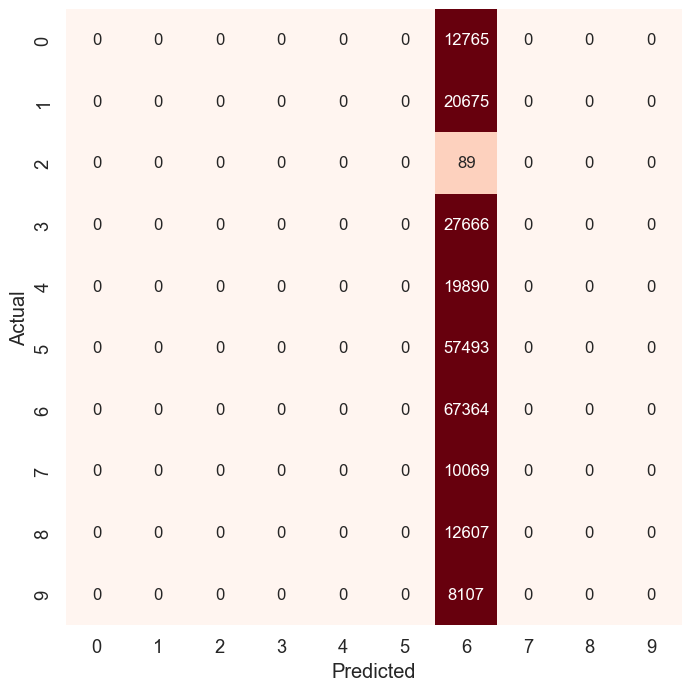

In [26]:
# Plot the confusion matrix
data = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (8,8))
sns.set(font_scale=1.2)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 12}, cbar=False,
          vmax=500, square=True, fmt="d", cmap="Reds")

The Classifiers, and Neural Network models were used. Accuracy in predicting Crime Type is very low, < 50%. The following reasons can explain the cause:
+ The correlations between features to Crime Type data are very low.
+ The data used to predict Crime Type are few and fragmentary.
By researching other research papers, the data set needs to add other essential data to create a better correlation for predicting Crime Type.

## 6. Predict Crime Hotspots

The crime prediction model has not produced good results. Next, in this study, we will build a prediction model of Crime Hotspots.

By decentralizing alert levels, the model helps predict areas of frequent crime.

In [27]:
# Load cleaned dataset before making dummies
crime = pd.read_csv("./Dataset/crimedata_cleaned.csv")
crime.head(2)

,type,year,month,day,hour,minute,hundred_block,neighbourhood,x,y
0,Break and Enter Commercial,2019,3,7,2,6,10XX SITKA SQ,Fairview,490612.9648,5.457110e+06
1,Break and Enter Commercial,2019,8,27,4,12,10XX ALBERNI ST,West End,491007.7798,5.459174e+06


In [28]:
# Make crime dataframe
crime = crime[['month','day','hour','neighbourhood','type']]
crime.head(1)

,month,day,hour,neighbourhood,type
0,3,7,2,Fairview,Break and Enter Commercial


Create a data frame for defining alert zones.

In [29]:
# Group dataframe by year, month, day, neighbourhood and count crime type column.
crime = crime.groupby(['month','day','hour','neighbourhood'], as_index=False).agg({"type":"count"})
crime.head()

,month,day,hour,neighbourhood,type
0,1,1,0,Arbutus Ridge,12
1,1,1,0,Central Business District,271
2,1,1,0,Dunbar-Southlands,15
3,1,1,0,Fairview,46
4,1,1,0,Grandview-Woodland,87


In [30]:
# Check crime dataset shape
crime.shape

(159345, 5)

In [31]:
print("An average number of crimes per hour in an area: ",crime['type'].sum()/159345,".")

An average number of crimes per hour in an area:  5.209331952681289 .


Alert level
- 0 - 2: Level 1, Low crime spots
- 3 - 5: Level 2, Near Medium crime spots
- 6 - 9: Level 3, Medium crime spots
- 10 - 12: Level 4, Nearly high crime spots
- 13 - 15: Level 5, High crime spots
- '> 15: Level 6, Very high crime spots

In [32]:
# Feature Engineer and create a new feature
def crime_rate(x):
    if(x<3):
        return 1
    elif(x>=3 and x<6):
        return 2
    elif(x>=6 and x<9):
        return 3
    elif(x>=9 and x<12):
        return 4
    elif(x>=12 and x<15):
        return 5
    else:
        return 6
crime['alert'] = crime['type'].apply(crime_rate)
crime = crime[['month','day','hour','neighbourhood','type','alert']]
crime.head()

,month,day,hour,neighbourhood,type,alert
0,1,1,0,Arbutus Ridge,12,5
1,1,1,0,Central Business District,271,6
2,1,1,0,Dunbar-Southlands,15,6
3,1,1,0,Fairview,46,6
4,1,1,0,Grandview-Woodland,87,6


In [33]:
# Check alert count
crime['alert'].value_counts()

1    68069
2    47510
3    20788
6     9799
4     9291
5     3888
Name: alert, dtype: int64

Transform neighbourhood feture to numerical values

In [34]:
#Import LabelEncoder
from sklearn.preprocessing import LabelEncoder

gle = LabelEncoder()
#make type_lable
neighbourhood_gle = gle.fit_transform(crime.neighbourhood)
#create new column
crime['neighbourhood_gle'] = neighbourhood_gle
crime.drop('neighbourhood', axis=1, inplace=True)

In [35]:
crime.head(1)
print(crime.shape)

(159345, 6)


In the same way, we will divide the crime dataset into two parts 95% for training and testing and 5% to test the performance of the best model.

In [36]:
# Dataset for training and testing
crime_95 = crime.loc[:151345,:]
# Out-of-sample dataset
Out_of_sample_crime = crime.loc[151345:,:]
print(crime.shape)
print(Out_of_sample_crime.shape)

(159345, 6)
(8000, 6)


Set X as features to predict the target y.

In [37]:
y = crime_95['alert']
X = crime_95.drop('alert', axis=1)

In [38]:
# Use 70% for training and 30% for testing
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [39]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, log_loss

In [40]:
#Names of the various classification approaches for easy presentation of the results
names = ["Logististic Regression", "Nearest Neighbors", "Naive Bayes", "Random Forest"]

scores = [] #list variable to hold classification scores (predictive accuracy scores)

#Prepare models for VotingClassifier 
#creeate instances (i.e., objects) of the various classifiers
lr =LogisticRegression()
knn = KNeighborsClassifier(3)
gnbs = GaussianNB()

classifiers = [
    lr,
    knn,
    gnbs,
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1)]

#run classification models using Pipeline
for classifier in classifiers:
    pipeline = Pipeline(steps=[
                      ('classifier', classifier)])
    pipeline.fit(x_train, y_train)   
    print(classifier)
    scores.append(pipeline.score(x_test, y_test))
    print("model score: %.3f" % pipeline.score(x_test, y_test))
    print("\n -----------------------------------------------------------------------------------")
    
#end of pipeline

#Create a dataframe for prediction scores
scores_df = pd.DataFrame(zip(names,scores), columns=['Classifier', 'Accuracy Score'])

C:\Users\thien\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()
model score: 0.886

 -----------------------------------------------------------------------------------
KNeighborsClassifier(n_neighbors=3)
model score: 0.919

 -----------------------------------------------------------------------------------
GaussianNB()
model score: 0.998

 -----------------------------------------------------------------------------------
RandomForestClassifier(max_depth=5, max_features=1, n_estimators=10)
model score: 0.833

 -----------------------------------------------------------------------------------


In [41]:
print(scores_df)

               Classifier  Accuracy Score
0  Logististic Regression        0.886442
1       Nearest Neighbors        0.919412
2             Naive Bayes        0.998480
3           Random Forest        0.832724


The Naive Bayes model has the highest accuracy score.

Next, choose the Naive Bayes model to check the classification report and confusion matrix.

In [42]:
# Import confusion_matrix and classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

pipe = Pipeline([
        ('scaler', RobustScaler()),
        ('classifier', GaussianNB()) ])
pipe.fit(x_train, y_train)
y_pred = pipe.predict(x_test)
    
print("Detailed classification report:")
print()
print(classification_report(y_test, y_pred))

Detailed classification report:

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     19343
           2       1.00      1.00      1.00     13472
           3       1.00      1.00      1.00      6003
           4       1.00      1.00      1.00      2608
           5       0.94      1.00      0.97      1132
           6       1.00      0.98      0.99      2846

    accuracy                           1.00     45404
   macro avg       0.99      1.00      0.99     45404
weighted avg       1.00      1.00      1.00     45404



All 6 lert level, the model provide high precision, recall, f1-score.

We make for the confusion matrix

[[19343     0     0     0     0     0]
 [    0 13472     0     0     0     0]
 [    0     0  6003     0     0     0]
 [    0     0     0  2608     0     0]
 [    0     0     0     0  1132     0]
 [    0     0     0     0    69  2777]]


<Axes: xlabel='Predicted', ylabel='Actual'>

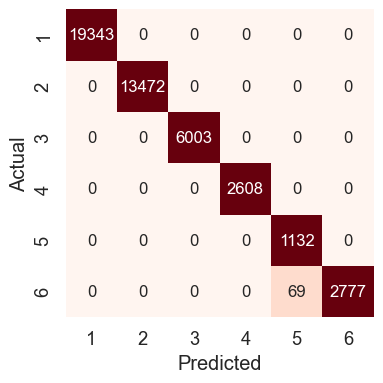

In [43]:
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
data = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (4,4))
sns.set(font_scale=1.2)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 12}, cbar=False,
          vmax=500, square=True, fmt="d", cmap="Reds")

### 7. Out-of-sample Predictions

The crime prediction models do not provide a good accuracy score, so we do not use the crime prediction model to check the performance in the out-of-sample dataset. While the hotspot prediction models give high accuracy, so we use the best model to check the out-of-sample dataset.

Set target and features for out-of-sample dataset.

In [44]:
y = Out_of_sample_crime['alert']
X = Out_of_sample_crime.drop('alert', axis=1)

In [45]:
# Split the dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Use RobustScaler and Naive Bayes to check prediction for the out-of-sample dataset.

In [46]:
# Import confusion_matrix and classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

pipe = Pipeline([
        ('scaler', RobustScaler()),
        ('regressor', GaussianNB()) ])
pipe.fit(x_train, y_train)
y_pred = pipe.predict(x_test)
    
print("Detailed classification report:")
print()
print(classification_report(y_test, y_pred))

Detailed classification report:

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      1134
           2       1.00      1.00      1.00       721
           3       1.00      1.00      1.00       253
           4       1.00      1.00      1.00       111
           5       0.98      1.00      0.99        54
           6       1.00      0.99      1.00       127

    accuracy                           1.00      2400
   macro avg       1.00      1.00      1.00      2400
weighted avg       1.00      1.00      1.00      2400



[[1134    0    0    0    0    0]
 [   0  721    0    0    0    0]
 [   0    0  253    0    0    0]
 [   0    0    0  111    0    0]
 [   0    0    0    0   54    0]
 [   0    0    0    0    1  126]]


<Axes: xlabel='Predicted', ylabel='Actual'>

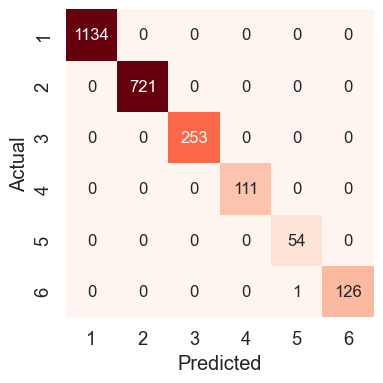

In [47]:
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
data = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (4,4))
sns.set(font_scale=1.2)
sns.heatmap(df_cm, annot=True,annot_kws={"size": 12}, cbar=False,
          vmax=500, square=True, fmt="d", cmap="Reds")

Through the classification report and confusion matrix, the model using RobustScaler and Naive Bayes has produced outstanding prediction results for the crime hotspot area.